In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from itertools import product
from dateutil.relativedelta import relativedelta

import scipy.stats as scs
from scipy import stats
import statsmodels.api as sm
import statsmodels.formula.api as smf
import statsmodels.tsa.api as smt
from scipy.optimize import minimize

from sklearn.metrics import mean_absolute_error, mean_squared_error

from tqdm.notebook import tqdm
from tqdm import tqdm_notebook

from sklearn.model_selection import train_test_split # разбиение данных на тренировочные и тестовые


from sklearn.preprocessing import StandardScaler # нормализация и масштабирование данных

from sklearn.model_selection import TimeSeriesSplit

from sklearn.model_selection import cross_val_score # кроссвалидация
from sklearn.model_selection import GridSearchCV # подбор гиперпараметров с кроссвалидацией

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV, RidgeCV
from xgboost import XGBRegressor

import statsmodels


import gc
import glob
import os
from scipy import stats
import plotly.express as px
import plotly.graph_objects as go
from numpy import percentile

# sns.set()
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

from tensorflow.keras.layers import Input, Dense, BatchNormalization, Activation, Dropout
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import regularizers
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import silhouette_samples
from tqdm import tqdm
from tensorflow.keras.models import load_model

from itertools import product

In [ ]:
import numpy as np
from keras.models import Sequential
from keras.layers import LSTM, Input, Dropout, Activation
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from keras.models import Model
import seaborn as sns

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
all_files_cpu = glob.glob(os.path.join("/content/drive/MyDrive/Colab Notebooks/k8s/cpu/*.csv"))
all_files_cpu.sort()

li = []

for filename in all_files_cpu:
    print(filename)
    df = pd.read_csv(filename, skiprows=[0], parse_dates=['Time'])
    li.append(df)


cpu = pd.concat(li, axis=0, ignore_index=True)

fields_nodes_all = ['real: cl1i6ek5us1gmcv87dql-oqaz |  ', 'real: cl1i6ek5us1gmcv87dql-ulyg |  ', 'real: cl1i6ek5us1gmcv87dql-utuc |  ']
fields_nodes_first = ['Time', 'real: cl1i6ek5us1gmcv87dql-oqaz |  ']

cpu.columns = ['Time', 'node1', 'node2', 'node3']
cpu['nodes_all'] = cpu['node1'] + cpu['node2'] + cpu['node3']


/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU10-15__10-20.csv
/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU10-21__10-24.csv
/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU10-25__10-27.csv
/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU10-27__11-03.csv
/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU11-03__11-08.csv
/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU11-08__11-11.csv
/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU11-12__11-14.csv
/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU11-14__11-18.csv
/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU11-19__11-22.csv
/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU2023-11-22__2023-11-26.csv
/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU2023-11-27__2023-12-02.csv
/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU2023-12-02__2023-12-09.csv
/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU2023-12-10__2023-12-16.csv
/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU2023-12-17-2023-12-22.csv
/content/driv

In [ ]:
cpu

,Time,node1,node2,node3,nodes_all
0,2023-10-15 19:10:00,0.7230,0.174,0.490,1.3870
1,2023-10-15 19:15:00,1.6500,0.953,0.492,3.0950
2,2023-10-15 19:20:00,1.3900,0.824,0.378,2.5920
3,2023-10-15 19:25:00,1.4000,0.734,0.473,2.6070
4,2023-10-15 19:30:00,1.4900,0.879,0.528,2.8970
...,...,...,...,...,...
31031,2024-02-04 23:35:00,0.0799,0.218,0.186,0.4839
31032,2024-02-04 23:40:00,0.0799,0.218,0.188,0.4859
31033,2024-02-04 23:45:00,0.0801,0.215,0.188,0.4831
31034,2024-02-04 23:50:00,0.0805,0.217,0.187,0.4845


In [ ]:
df_cpu = cpu[['Time', 'node1']]
df_cpu.columns = ['time', 'cpu_usage']
df_cpu.set_index('time', inplace=True)

#df_cpu = df_cpu.resample('1H', base=0.5).last()


print(df_cpu.isnull().any())
print(df_cpu.isna().any())
df_cpu['cpu_usage'].fillna(df_cpu['cpu_usage'].mean(), inplace=True)
print(df_cpu.isnull().any())
print(df_cpu.isna().any())

cpu_usage    False
dtype: bool
cpu_usage    False
dtype: bool
cpu_usage    False
dtype: bool
cpu_usage    False
dtype: bool


In [ ]:
df_cpu

,cpu_usage
time,
2023-10-15 19:10:00,0.7230
2023-10-15 19:15:00,1.6500
2023-10-15 19:20:00,1.3900
2023-10-15 19:25:00,1.4000
2023-10-15 19:30:00,1.4900
...,...
2024-02-04 23:35:00,0.0799
2024-02-04 23:40:00,0.0799
2024-02-04 23:45:00,0.0801


In [ ]:
all_files_ram = glob.glob(os.path.join("/content/drive/MyDrive/Colab Notebooks/k8s/ram/*.csv"))
all_files_ram.sort()

li = []

for filename in all_files_ram:
    df = pd.read_csv(filename, skiprows=[0], parse_dates=['Time'])
    li.append(df)


ram = pd.concat(li, axis=0, ignore_index=True)

fields_nodes_all = ['real: cl1i6ek5us1gmcv87dql-oqaz |  ', 'real: cl1i6ek5us1gmcv87dql-ulyg |  ', 'real: cl1i6ek5us1gmcv87dql-utuc |  ']
fields_nodes_first = ['Time', 'real: cl1i6ek5us1gmcv87dql-oqaz |  ']
print(ram)
ram.columns = ['Time', 'node1', 'node2', 'node3']
ram['nodes_all'] = ram['node1'] + ram['node2'] + ram['node3']

                     Time  real: cl1i6ek5us1gmcv87dql-oqaz |   \
0     2023-10-15 19:10:00                         37038891008   
1     2023-10-15 19:15:00                         37153251328   
2     2023-10-15 19:20:00                         37240102912   
3     2023-10-15 19:25:00                         37333958656   
4     2023-10-15 19:30:00                         37343805440   
...                   ...                                 ...   
31031 2024-02-04 23:35:00                         59966435328   
31032 2024-02-04 23:40:00                         60111867904   
31033 2024-02-04 23:45:00                         60007501824   
31034 2024-02-04 23:50:00                         59999752192   
31035 2024-02-04 23:55:00                         59993530368   

       real: cl1i6ek5us1gmcv87dql-ulyg |   real: cl1i6ek5us1gmcv87dql-utuc |   
0                             36398960640                         38560374784  
1                             36420562944                  

In [ ]:
ram

,Time,node1,node2,node3,nodes_all
0,2023-10-15 19:10:00,37038891008,36398960640,38560374784,111998226432
1,2023-10-15 19:15:00,37153251328,36420562944,39022686208,112596500480
2,2023-10-15 19:20:00,37240102912,36420161536,39149137920,112809402368
3,2023-10-15 19:25:00,37333958656,36423467008,39163170816,112920596480
4,2023-10-15 19:30:00,37343805440,36425986048,40512155648,114281947136
...,...,...,...,...,...
31031,2024-02-04 23:35:00,59966435328,50358718464,52388679680,162713833472
31032,2024-02-04 23:40:00,60111867904,50365763584,52309880832,162787512320
31033,2024-02-04 23:45:00,60007501824,50336706560,52273143808,162617352192
31034,2024-02-04 23:50:00,59999752192,50343628800,52292202496,162635583488


In [ ]:
df_ram = ram[['Time', 'node1']]
df_ram.columns = ['time', 'ram_usage']
df_ram.set_index('time', inplace=True)

#df_ram = df_ram.resample('1H', base=0.5).last()


print(df_ram.isnull().any())
print(df_ram.isna().any())
df_ram['ram_usage'].fillna(df_ram['ram_usage'].mean(), inplace=True)
print(df_ram.isnull().any())
print(df_ram.isna().any())

ram_usage    False
dtype: bool
ram_usage    False
dtype: bool
ram_usage    False
dtype: bool
ram_usage    False
dtype: bool


In [ ]:
df_ram

,ram_usage
time,
2023-10-15 19:10:00,37038891008
2023-10-15 19:15:00,37153251328
2023-10-15 19:20:00,37240102912
2023-10-15 19:25:00,37333958656
2023-10-15 19:30:00,37343805440
...,...
2024-02-04 23:35:00,59966435328
2024-02-04 23:40:00,60111867904
2024-02-04 23:45:00,60007501824


In [ ]:
df_cpu['ram_usage'] = df_ram['ram_usage']
df = df_cpu
df

,cpu_usage,ram_usage
time,,
2023-10-15 19:10:00,0.7230,37038891008
2023-10-15 19:15:00,1.6500,37153251328
2023-10-15 19:20:00,1.3900,37240102912
2023-10-15 19:25:00,1.4000,37333958656
2023-10-15 19:30:00,1.4900,37343805440
...,...,...
2024-02-04 23:35:00,0.0799,59966435328
2024-02-04 23:40:00,0.0799,60111867904
2024-02-04 23:45:00,0.0801,60007501824


In [ ]:
for column in df.columns:
    fig = px.line(df, x=df.index, y=[column], title='AWS ' + column, template = 'plotly_dark')
    fig.show()

# LSTM

In [ ]:
df_sc = df.copy()
column_usage = 'ram_usage'

scaler = StandardScaler()
scaler = scaler.fit(df_sc[[column_usage]])

df_sc[column_usage] = scaler.transform(df[[column_usage]])

In [ ]:
seq_size = 30

In [ ]:
def to_sequences(x, y, seq_size=1):
    x_values = []
    y_values = []

    for i in range(len(x)-seq_size):
        #print(i)
        x_values.append(x.iloc[i:(i+seq_size)].values)
        y_values.append(y.iloc[i+seq_size])

    return np.array(x_values), np.array(y_values)

In [ ]:
X, Y = to_sequences(df[[column_usage]], df[column_usage], seq_size)

Y = np.reshape(Y, (Y.shape[0], 1))
df_sc = df_sc.iloc[seq_size:, :]
df = df.iloc[seq_size:, :]

In [ ]:
model = Sequential()
model.add(LSTM(10, return_sequences = True, input_shape=(X.shape[1], X.shape[2])))
model.add(Activation('selu'))
model.add(Dropout(rate=0.2))

model.add(LSTM(10))
model.add(Activation('selu'))
model.add(Dropout(rate=0.2))

model.add(Dense(1))

model.compile(optimizer='adam', loss='mae')
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 30, 10)            480       
                                                                 
 activation (Activation)     (None, 30, 10)            0         
                                                                 
 dropout (Dropout)           (None, 30, 10)            0         
                                                                 
 lstm_1 (LSTM)               (None, 10)                840       
                                                                 
 activation_1 (Activation)   (None, 10)                0         
                                                                 
 dropout_1 (Dropout)         (None, 10)                0         
                                                                 
 dense (Dense)               (None, 1)                

In [ ]:
history = model.fit(X, Y, epochs=50, batch_size=16, validation_split=0.1, verbose=1)

Epoch 1/50


KeyboardInterrupt: 

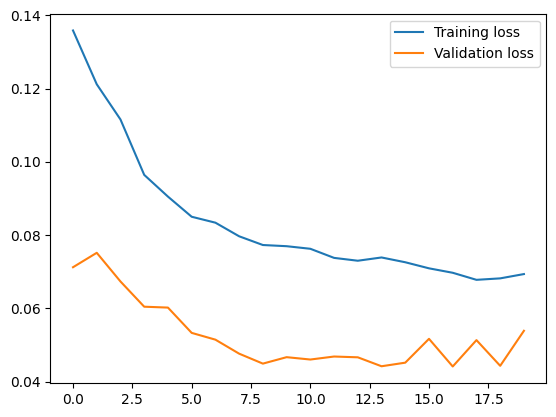

In [ ]:
plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.legend()

In [ ]:
fig = px.line(df,
              x=df.index,
              y=[scaler.inverse_transform(df_sc[[column_usage]]).flatten(),
                  scaler.inverse_transform(model.predict(X)).flatten()],
              title='AWS ' + column,
              template = 'plotly_dark')
fig.show()

967/967 [==============================] - 44s 44ms/step


In [ ]:
mean_absolute_error(df_sc[[column_usage]], model.predict(X))

967/967 [==============================] - 43s 44ms/step


0.0600929762999862

In [ ]:
pred_residuals = df_sc[[column_usage]] - model.predict(X)

967/967 [==============================] - 42s 43ms/step


In [ ]:
print(pred_residuals)
UCL = pd.DataFrame(pred_residuals).abs().sum(axis=1).quantile(0.95)
print(UCL)

fig = px.line(pred_residuals,
              x=df.index,
              y=[pred_residuals.iloc[:, 0]],
              title='График разностей сигналов',
              template = 'plotly_dark')
fig.show()

                     cpu_usage
time                          
2023-10-16 03:05:00   0.543785
2023-10-16 03:10:00   0.305237
2023-10-16 03:15:00   0.811172
2023-10-16 03:20:00   0.036676
2023-10-16 03:25:00   0.308285
...                        ...
2024-02-04 23:35:00  -0.025190
2024-02-04 23:40:00  -0.025141
2024-02-04 23:45:00  -0.024487
2024-02-04 23:50:00  -0.023332
2024-02-04 23:55:00  -0.022744

[30941 rows x 1 columns]
0.22703826319322595


In [ ]:
fig = px.line(df,
              x=df.index,
              y=[pd.DataFrame(pred_residuals, index=df.index).abs().sum(axis=1).values, np.full(shape=len(pred_residuals),fill_value=UCL,dtype=np.float64 )],
              title='График разностей сигналов',
              template = 'plotly_dark')
fig.show()

In [ ]:
dfx = df.copy()
dfx['is_outlier'] = pd.DataFrame(pred_residuals, index=df.index).abs().sum(axis=1) > UCL
dfx["outlier"] = dfx["is_outlier"].astype(int)
dfx

,cpu_usage,ram_usage,is_outlier,outlier
time,,,,
2023-10-16 03:05:00,1.7100,42598764544,True,1
2023-10-16 03:10:00,1.8000,42623778816,True,1
2023-10-16 03:15:00,1.8800,42730369024,True,1
2023-10-16 03:20:00,1.6300,42881167360,False,0
2023-10-16 03:25:00,1.5800,42827685888,True,1
...,...,...,...,...
2024-02-04 23:35:00,0.0799,59966435328,False,0
2024-02-04 23:40:00,0.0799,60111867904,False,0
2024-02-04 23:45:00,0.0801,60007501824,False,0


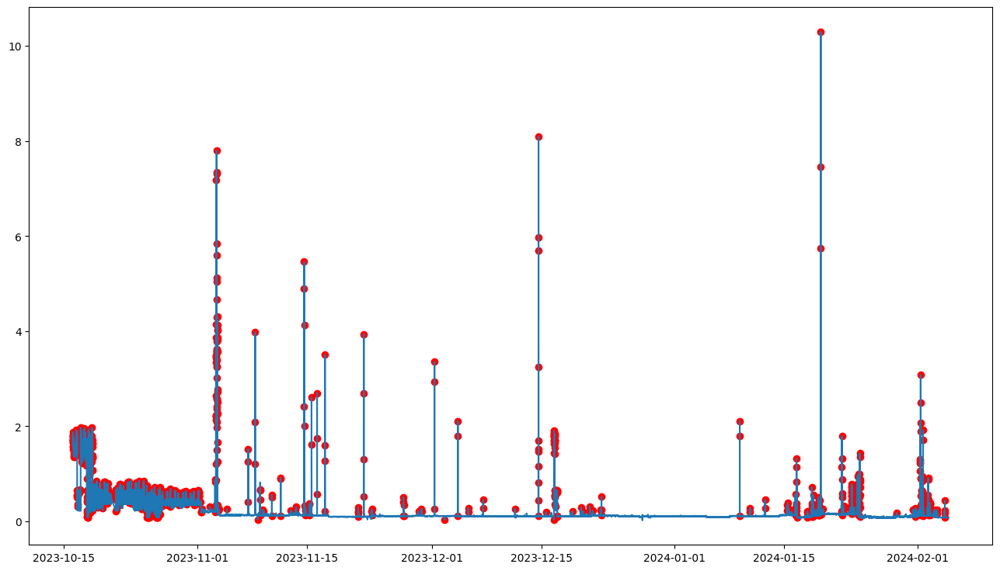

In [ ]:
fig, ax = plt.subplots(figsize=(16, 9))
a = dfx.loc[dfx.outlier == 1, [column_usage]]

ax.plot(dfx.index, dfx[column_usage])
ax.scatter(a.index, a[column_usage], color='red')
plt.show()

In [ ]:
y_pred = dfx['outlier']
colors = ['green' if a == 0 else 'red' for a in y_pred]

# Create a scatter plot of the data with anomalies highlighted in red
fig = go.Figure(data=go.Scatter(x=dfx.index, y=dfx[column_usage],
                                 mode='markers', marker=dict(color=colors, size=3)))

# Set the title and axis labels for the plot
fig.update_layout(title=dict(text='LOF Anomaly prediction', x=0.5),
                  yaxis_title='Value',
                  xaxis_title='Timestamp')

# Show the plot
fig.show()

# Metrics


In [ ]:
y_pred = y_pred == 0
dfx['name'] = y_pred
y_pred

time
2023-10-16 03:05:00    False
2023-10-16 03:10:00    False
2023-10-16 03:15:00    False
2023-10-16 03:20:00     True
2023-10-16 03:25:00    False
                       ...  
2024-02-04 23:35:00     True
2024-02-04 23:40:00     True
2024-02-04 23:45:00     True
2024-02-04 23:50:00     True
2024-02-04 23:55:00     True
Name: outlier, Length: 30941, dtype: bool

In [ ]:
p_values = {}
p_stats_ = {}
percent = {}
silhoutte = {}
calinski_harabasz = {}
davies_bouldin = {}

cols_in = [column_usage]

In [ ]:
dfx['name'].value_counts()

True     29394
False     1547
Name: name, dtype: int64

In [ ]:
#percent anomaly
dist = dfx['name'].value_counts(normalize=True)
print(dist)
percent['name'] = dist.loc[True]

True     0.950002
False    0.049998
Name: name, dtype: float64


In [ ]:
#silhouette conficient samples non-anomaly
labels = [1 if i == True else 2 for i in dfx['name']]
dfx['silhouette_zcore_'] = silhouette_samples(df[[column_usage]], labels)
silhoutte['name'] = dfx[dfx['name']]['silhouette_zcore_'].mean()

In [ ]:
#ks coeficient
normal = dfx.loc[dfx['name'] == False, [column_usage]]
anomaly = dfx.loc[dfx['name'] == True, [column_usage]]
print(normal)
for col_in in tqdm(cols_in):
  if len(normal)>0 and len(anomaly)>0:
    stats_, pvalue = stats.kstest(normal[col_in], anomaly[col_in])
    p_values[col_in+'_'] = pvalue
    p_stats_[col_in+'_'] = stats_

                     cpu_usage
time                          
2023-10-16 03:05:00     1.7100
2023-10-16 03:10:00     1.8000
2023-10-16 03:15:00     1.8800
2023-10-16 03:25:00     1.5800
2023-10-16 03:30:00     1.7000
...                        ...
2024-02-03 12:55:00     0.1680
2024-02-04 11:05:00     0.2330
2024-02-04 12:00:00     0.1860
2024-02-04 12:05:00     0.4420
2024-02-04 12:15:00     0.0808

[1547 rows x 1 columns]


100%|██████████| 1/1 [00:00<00:00, 145.69it/s]


In [ ]:
from sklearn.metrics import calinski_harabasz_score

ch_index = calinski_harabasz_score(df[[column_usage]], labels)
calinski_harabasz['name'] = round(ch_index, 3)
print("Calinski-Harabasz Index:", round(ch_index, 3))

Calinski-Harabasz Index: 10597.593


In [ ]:
from sklearn.metrics import davies_bouldin_score

dbi = davies_bouldin_score(df[[column_usage]], labels)
davies_bouldin['name'] = round(dbi, 3)
print("Davies-Bouldin Index:", round(dbi, 3))

Davies-Bouldin Index: 0.954


pvalue
  svm_algorithm  pvalue
0    cpu_usage_     0.0
{'cpu_usage_': 0.0}


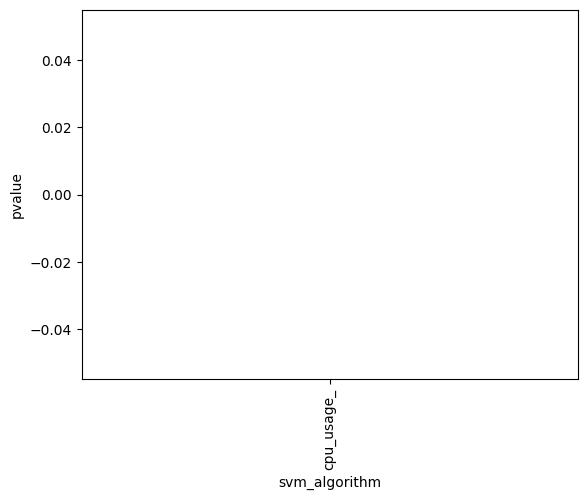

statistics
  svm_algorithm  statistics
0    cpu_usage_    0.801965
{'cpu_usage_': 0.8019645624198773}


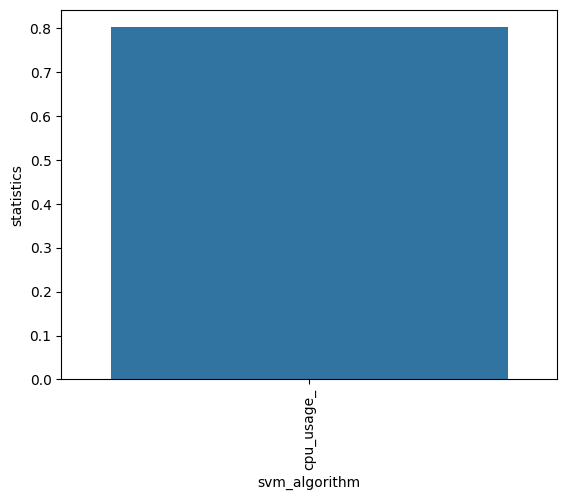

percent
  svm_algorithm   percent
0          name  0.950002
{'name': 0.9500016159787984}


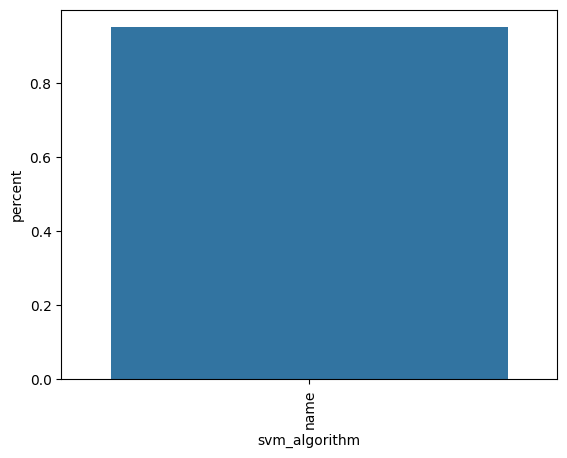

silhoutte
  svm_algorithm  silhoutte
0          name   0.841451
{'name': 0.8414512957343893}


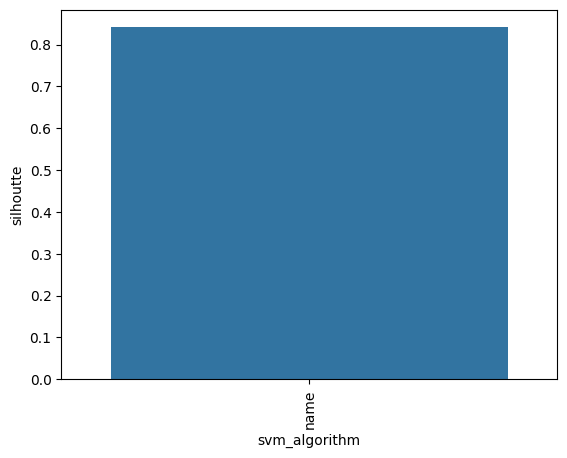

calinski_harabasz
  svm_algorithm  calinski_harabasz
0          name          10597.593
{'name': 10597.593}


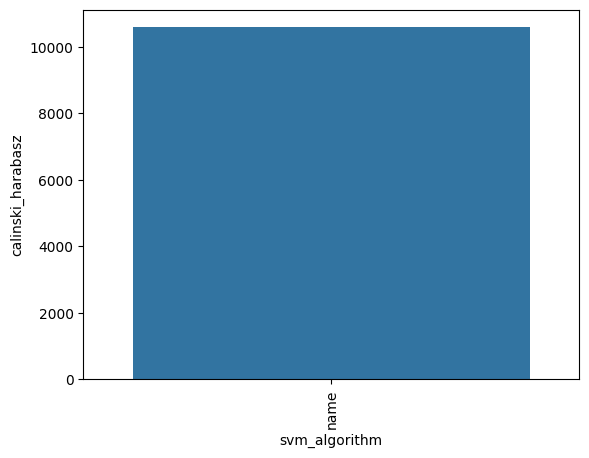

davies_bouldin
  svm_algorithm  davies_bouldin
0          name           0.954
{'name': 0.954}


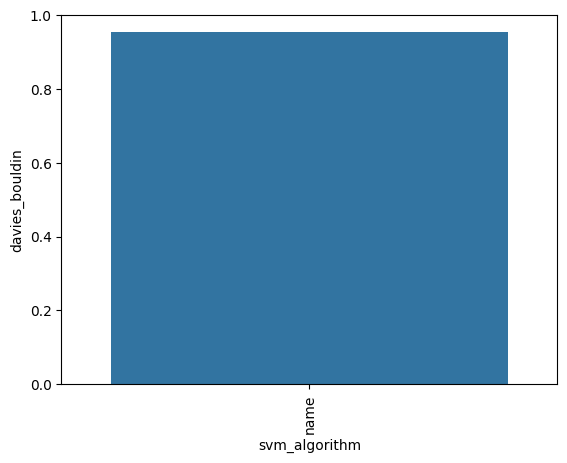

In [ ]:
for name, dictionary in {'pvalue': p_values, 'statistics': p_stats_, 'percent': percent, 'silhoutte':silhoutte, 'calinski_harabasz': calinski_harabasz, 'davies_bouldin': davies_bouldin}.items():
    print(name)
    df_values =  pd.DataFrame([dictionary])
    df_values = df_values.T
    df_values.reset_index(inplace=True)
    df_values.columns = ['svm_algorithm', name]
    print(df_values)
    print(dictionary)

    sns.barplot(data=df_values, x='svm_algorithm', y=name)
    plt.xticks(df_values.index, df_values['svm_algorithm'].values, rotation=90)
    plt.show()

In [ ]:
for name, dictionary in {'pvalue': p_values, 'statistics': p_stats_, 'percent': percent, 'silhoutte':silhoutte, 'calinski_harabasz': calinski_harabasz, 'davies_bouldin': davies_bouldin}.items():
    print(name + ': ' + str(np.array(list(dictionary.values())).mean()))

pvalue: 0.0
statistics: 0.8019645624198773
percent: 0.9500016159787984
silhoutte: 0.8414512957343893
calinski_harabasz: 10597.593
davies_bouldin: 0.954


# Save Model

In [ ]:
 model.save('/content/drive/MyDrive/Colab Notebooks/k8s/models/model_lstm_collected_' + column_usage + '.h5')
